In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import os, sys, json
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from sklearn.model_selection import train_test_split
sys.path.append('..')
from oads_access.oads_access import *

import torch.optim as optim
import torch
from torch import nn as nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torchvision.transforms as transforms

os.environ['MKL_THREADING_LAYER'] = 'GNU'
torch.multiprocessing.set_start_method('spawn')

In [2]:
from result_manager.result_manager import ResultManager

# Initialize Data Access

In [5]:
%matplotlib widget
home = '../../data/oads/mini_oads_2/datasets'
oads = OADS_Access(home)#, file_formats=None, min_size_crops=(50,50), max_size_crops=(50,50))

In [23]:
train_ids, val_ids, test_ids = oads.get_train_val_test_split_indices(use_crops=True)
dataloader = OADSImageDataset(oads_access=oads, item_ids=train_ids, use_crops=True, class_index_mapping=oads.get_class_mapping())
valdataloader = OADSImageDataset(oads_access=oads, item_ids=val_ids, use_crops=True, class_index_mapping=oads.get_class_mapping())
testdataloader = OADSImageDataset(oads_access=oads, item_ids=test_ids, use_crops=True, class_index_mapping=oads.get_class_mapping())

In [9]:
# Load Data
data = oads.get_data_iterator(file_formats=['.jpg'], use_crops=False)
len(data)

100%|██████████| 1/1 [00:08<00:00,  8.41s/it]


100

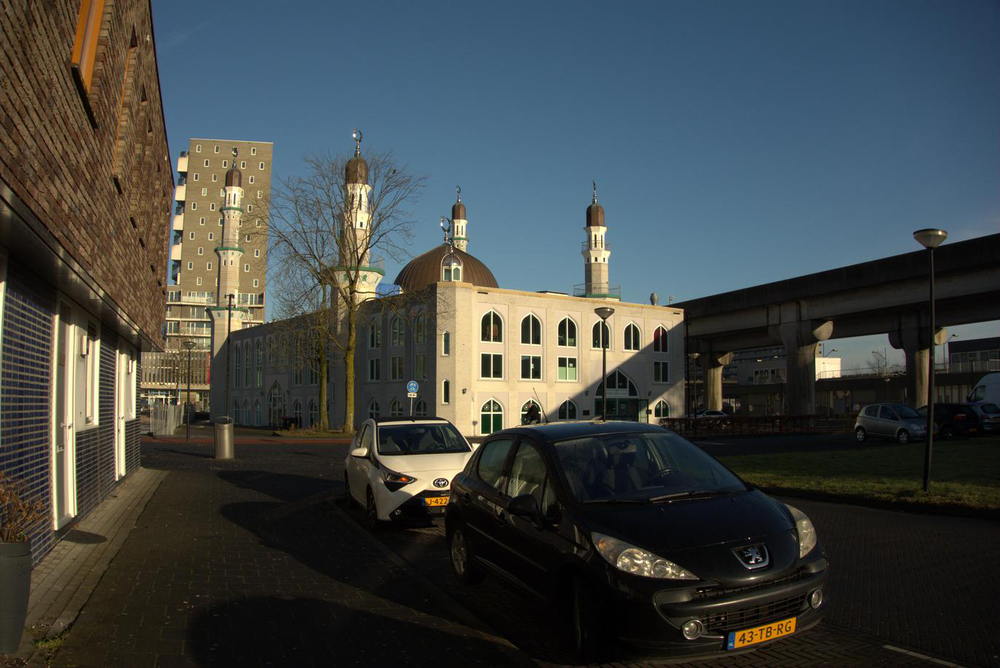

In [10]:
data[1][0]

In [26]:
# del data
crops = oads.get_crop_iterator(data_iterator=data, save_files=True)

100%|██████████| 17/17 [00:06<00:00,  2.59it/s]


In [105]:
len(crops)

1618

In [86]:
oads.prepare_crops()

100%|██████████| 1/1 [00:09<00:00,  9.80s/it]


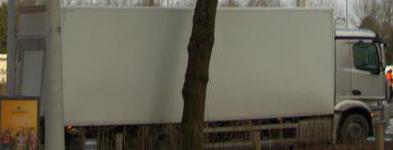

In [108]:
crops[0][0]

In [4]:
# 
crops30 = oads.get_crop_iterator([data[30]])
crops96 = oads.get_crop_iterator([data[96]])

In [ ]:
result_manager = ResultManager(home='')

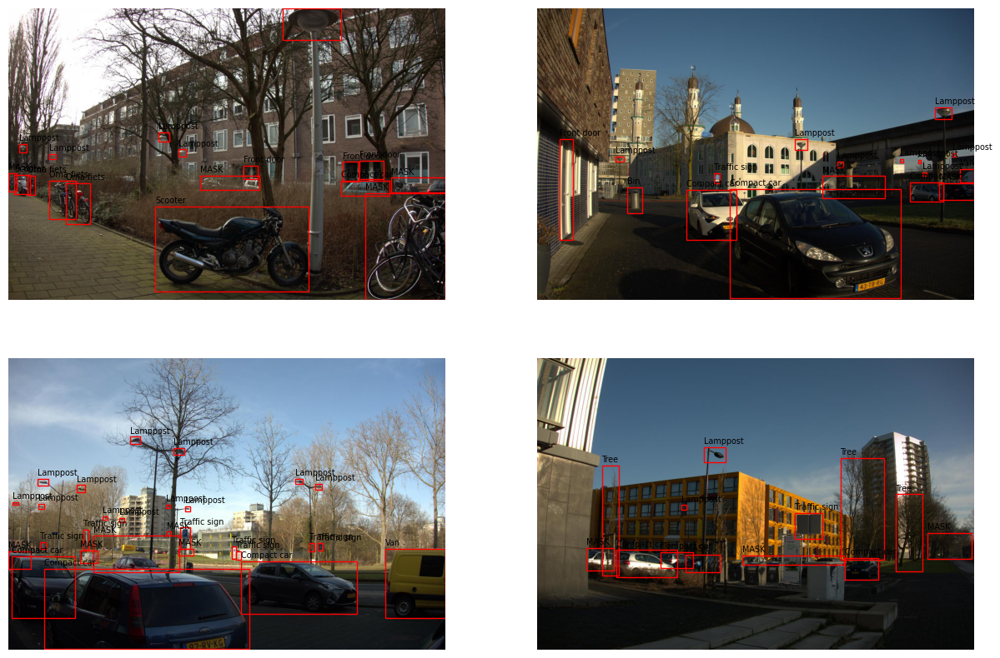

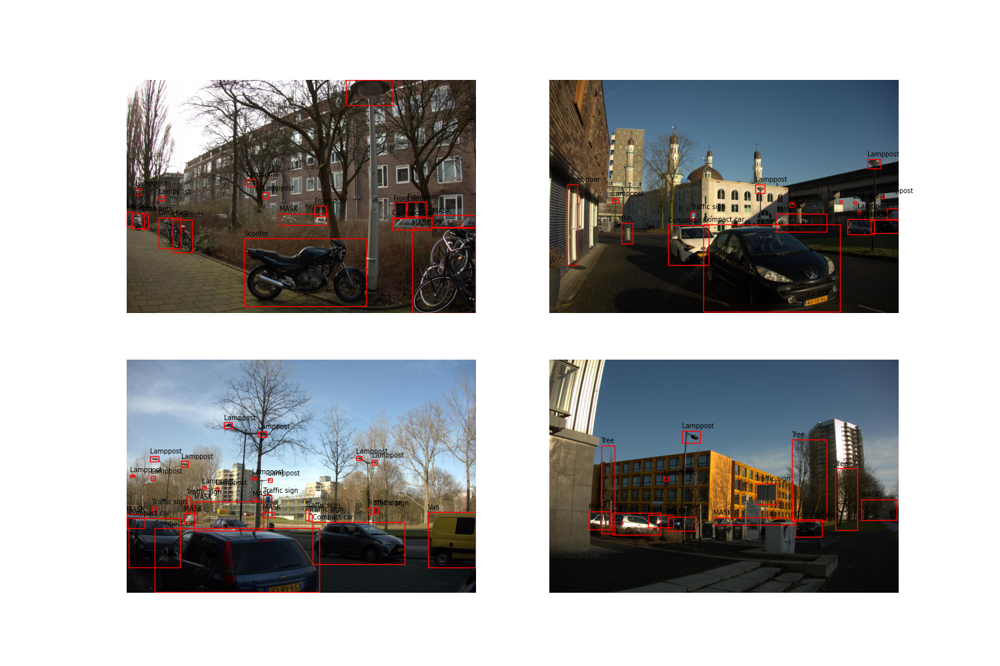

In [24]:
# Plot Images with annotation boxes

fig, ax = plt.subplots(2,2, figsize=(15, 10))
for (img, label), axis in zip(data[0:], ax.flatten()):
    # print(label['is_raw'])
    axis.imshow(img)
    add_label_box_to_axis(label, axis, add_title=True)
    axis.axis('off')
fig

# Visualize Data

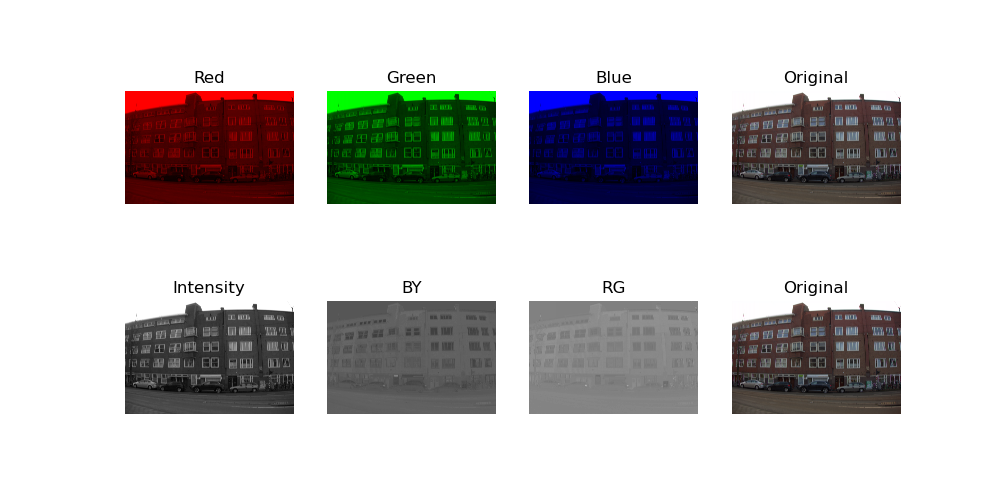

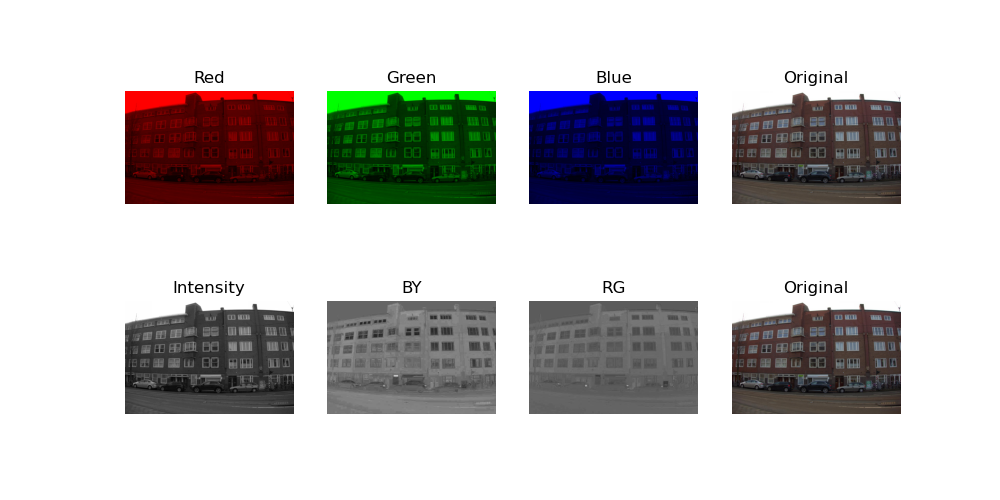

In [25]:
# Plot original image together with RGB color channels and opponent channels
image = np.array(data[30][0])
image2 = np.array(data[96][0])

fig = plot_image_in_color_spaces(image, cmap_opponent='gray')
fig2 = plot_image_in_color_spaces(image2, cmap_opponent='gray')
# fig

In [23]:
new_img = data[3][0].copy()
new_img.thumbnail(size=(96, 96))
np.array(data[3][0]).shape

(918, 1374, 3)

In [56]:
crops[0][0].thumbnail(size=(250,250))
crops[0][0].save('./results/crop_0.jpg')

In [57]:
from PIL.JpegImagePlugin import JpegImageFile

img = JpegImageFile('./results/crop_0.jpg')

In [58]:
np.array(img).shape

(250, 250, 3)

In [32]:
np.array([np.array(crop[0]).shape for crop in crops]).min(axis=(0))

array([96, 96,  3])

In [5]:
size = max(oads.get_maximum_annotation_size(data_iterator=data))

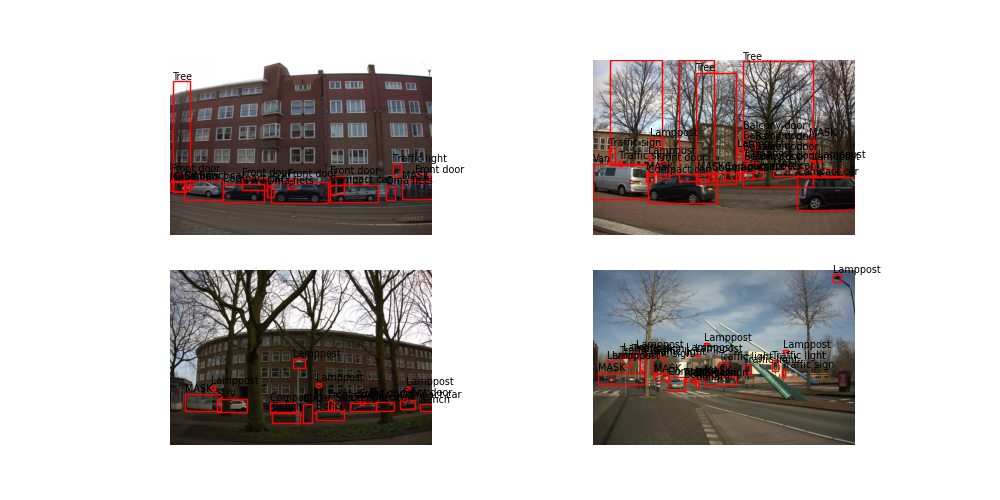

In [ ]:
# Plot Images with annotation boxes
fig, ax = plt.subplots(2,2, figsize=(10, 5))
for (img, label), axis in zip(data[96:], ax.flatten()):
    # print(label['is_raw'])
    axis.imshow(img)
    add_label_box_to_axis(label, axis, add_title=True)
    axis.axis('off')

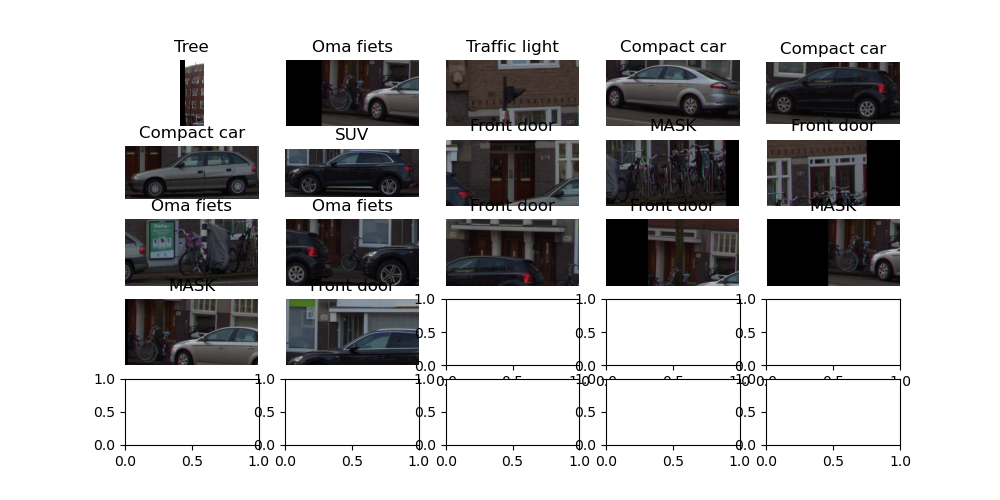

In [13]:
# Plot each crop corresponding to a annotation box in a subplot
fig = plot_crops_from_data_tuple(data[30], min_size=(200, 100), figsize=(10, 5), max_size=None)
# fig

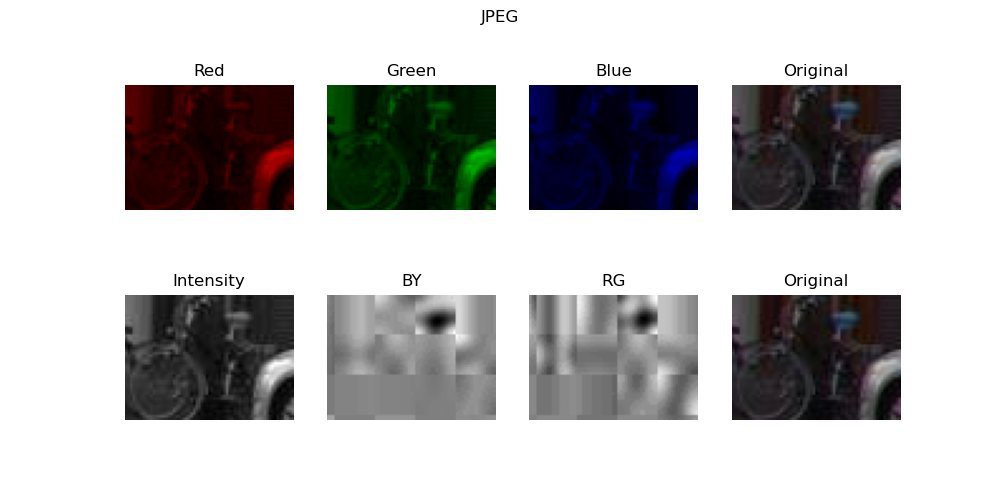

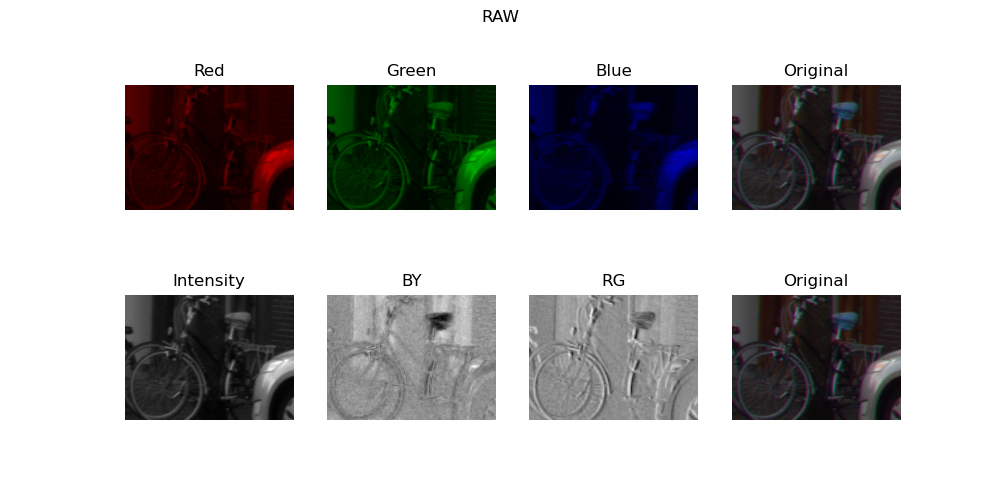

In [30]:
# Plot crop together with RGB color channels and opponent channels
# image = np.array(crops[1][0])
image = np.array(crops30[1][0])
image2 = np.array(crops96[1][0])
# image = np.array(train_data[0][0])
fig = plot_image_in_color_spaces(image, cmap_opponent='gray')
fig.suptitle('RAW')
fig = plot_image_in_color_spaces(image2, cmap_opponent='gray')
fig.suptitle('JPEG')
plt.show()

# Prepare dataset for DNN training

In [ ]:
train_data, val_data, test_data = oads.get_train_val_test_split(use_crops=True, min_size=(200,200), max_size=(200,200), file_formats=['.ARW'], exclude_oversized_crops=True)
input_channels = np.array(train_data[0][0]).shape[-1]

output_channels = len(oads.get_class_mapping())

In [40]:
n_s = []
for i in range(50, 1000, 50):
    try:
        train_data, val_data, test_data = oads.get_train_val_test_split(use_crops=True, min_size=(i,i), max_size=(i,i), file_formats=['.ARW'], exclude_oversized_crops=True)
    except ValueError as e:
        n_s.append(0)
        continue
    n = len(train_data) + len(val_data) + len(test_data)
    n_s.append(n)

: 

: 

Text(0, 0.5, 'N images')

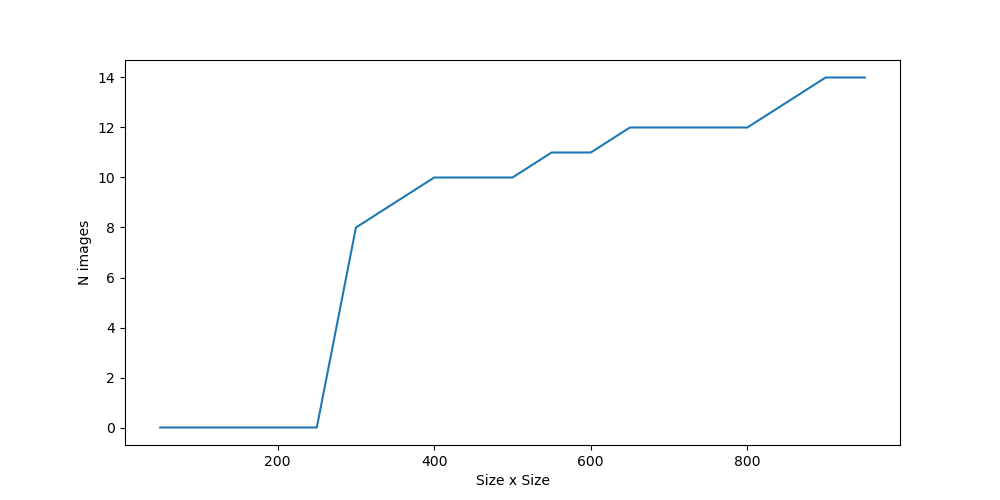

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(10,5))
ax.plot(range(50, 1000, 50), n_s)
ax.set_xlabel('Size x Size')
ax.set_ylabel('# crops')

In [155]:
oads.prepare_crops()

100%|██████████| 1/1 [00:08<00:00,  8.63s/it]


In [156]:
class_index_mapping = {key: index for index, key in enumerate(list(oads.get_class_mapping().keys()))}

In [10]:
batch_size = 10

transform = transforms.Compose([
    transforms.ToTensor(),
    # transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])
train_ids, val_ids, test_ids = oads.get_train_val_test_split_indices(use_crops=True)
traindataset = OADSImageDataset(oads_access=oads, item_ids=train_ids, use_crops=True, transform=transform, device=torch.device('cuda'))
valdataset = OADSImageDataset(oads_access=oads, item_ids=val_ids, use_crops=True, transform=transform, device=torch.device('cuda'))
testdataset = OADSImageDataset(oads_access=oads, item_ids=test_ids, use_crops=True, transform=transform, device=torch.device('cuda'))

trainloader = DataLoader(traindataset, batch_size=batch_size, shuffle=True, num_workers=2)
valloader = DataLoader(valdataset, batch_size=batch_size, shuffle=True, num_workers=2)
testloader = DataLoader(testdataset, batch_size=batch_size, shuffle=True, num_workers=2)

In [160]:
# from torchvision.utils import make_grid

dataiter = iter(trainloader)
timeit.timeit("lambda x: daiter.next()", number=10000000)
# images, labels = dataiter.next()

# # def imshow(img):
# # #     npimg = img.numpy()
# #     plt.imshow(np.transpose(img, (1,2,0)))
# #     plt.show()

# # imshow(make_grid(images))
# # images

1.4664664000010816

# Model 

In [54]:
from torchvision.models import resnet18, resnet50, alexnet, 

In [55]:
from pytorch_utils.pytorch_utils import train

In [56]:
model18 = resnet18(weights=None)
model50 = resnet50(weights=None)
modelalex = alexnet(weights=None)

In [58]:
modelalex

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [36]:
model.fc = nn.Linear(in_features=512, out_features=len(oads.get_class_mapping()), bias=True)

In [37]:
img, label = next(iter(trainloader))

In [12]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

In [46]:
model = model.to(torch.device('cuda'))
train(model, trainloader=trainloader, valloader=valloader, loss_fn=criterion, optimizer=optimizer, device=torch.device('cuda'), n_epochs=1)

RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call,so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.

# Non-functional: Downsample the resolution like a gaussian filter
Such that the resolution in the middle of the annotation box is basically kept and the resolution decrease towards the edges of the image

In [235]:
_x = np.array(data[0][0])

1. Create Gaussian with same size as data
2. Normalize between 0 and 1
3. Interpret each entry as probability on whether the pixel is kept

In [286]:
height = data[0][1]['size']['height']
width = data[0][1]['size']['width']

In [305]:
x_grid = np.linspace(0, width, width, endpoint=True)
y_grid = np.linspace(0, height, height, endpoint=True)
x, y = np.meshgrid(x_grid, y_grid)

sigma = 60
mu = (60.0, 60.0)

gaussian = np.exp(-((x-mu[0])**2 + (y-mu[0])**2) / (2*sigma**2)) / (2 * np.pi * sigma**2)

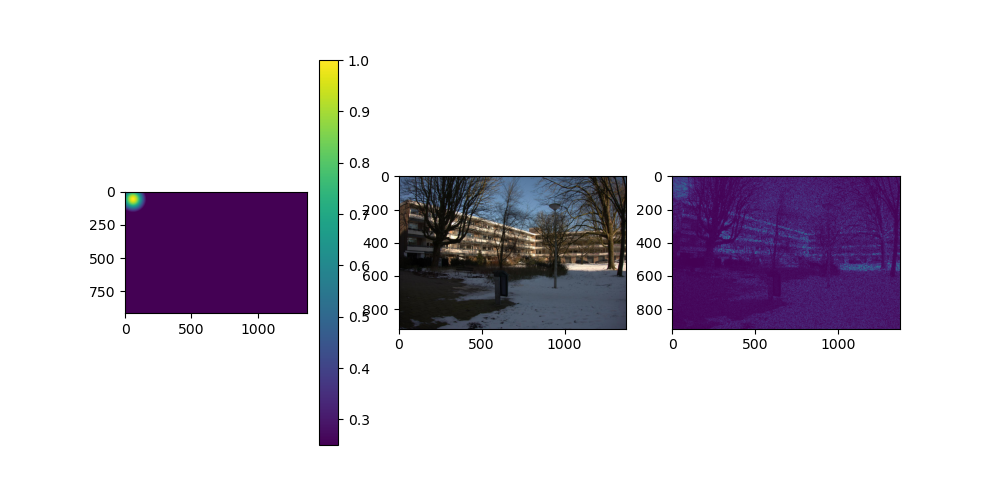

In [306]:
fig, ax = plt.subplots(1,3, figsize=(10,5))
norm = gaussian / np.max(gaussian)
norm = np.where(norm<0.25, 0.25, norm)
bar = ax[0].imshow(norm)
plt.colorbar(bar, ax=ax[0])

ax[1].imshow(data[0][0])

samples = np.random.random((height, width))
# samples = np.where(samples<norm, True, False)
ax[2].imshow(np.where(samples<norm, np.array(data[0][0])[:,:,0], 0))

(array([ 8., 12.,  6., 13., 11., 10., 10., 10.,  8., 12.]),
 array([0.00336121, 0.10182743, 0.20029365, 0.29875988, 0.3972261 ,
        0.49569232, 0.59415854, 0.69262477, 0.79109099, 0.88955721,
        0.98802344]),
 <BarContainer object of 10 artists>)

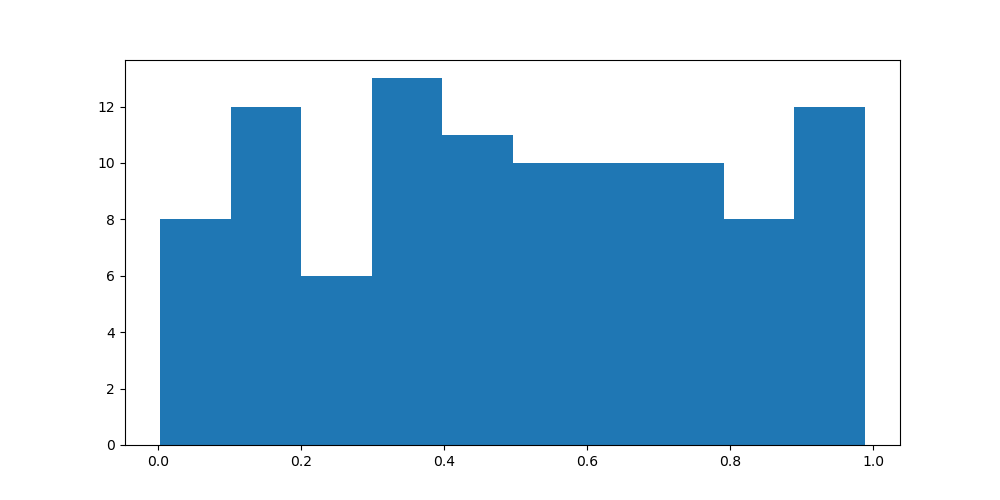

In [244]:
fig, ax = plt.subplots(1,1, figsize=(10,5))

ax.hist(np.random.random(size=(100)).flatten())

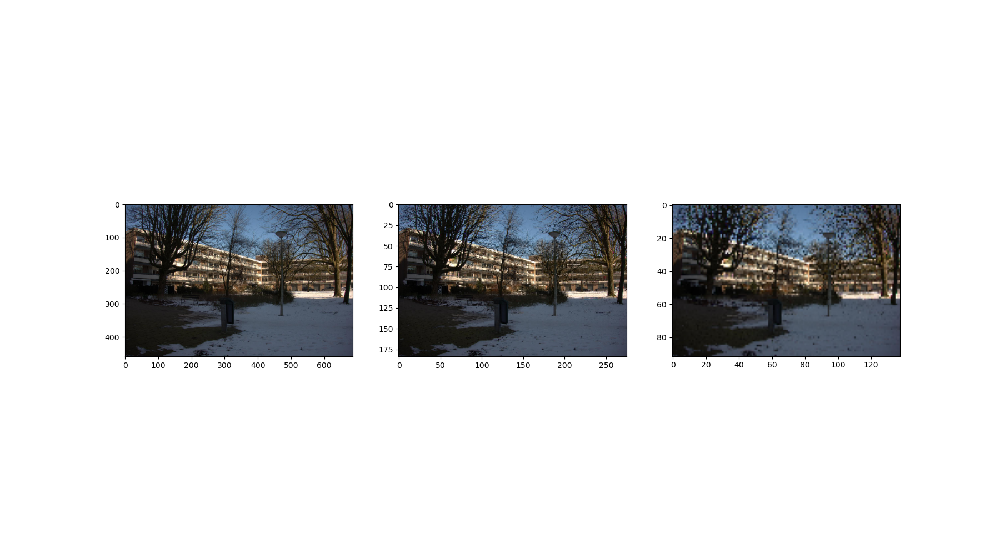

In [226]:
fig, ax = plt.subplots(1,3, figsize=(18,10))

ax[0].imshow(Image.fromarray(_x[::2,::2,:]))
ax[1].imshow(Image.fromarray(_x[::5,::5,:]))
ax[2].imshow(Image.fromarray(_x[::10,::10,:]))